In [1]:
from utils import data_loader
from utils import model

import numpy as np

from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from skimage.metrics import structural_similarity, peak_signal_noise_ratio

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from utils.heat_map import HeatMap
from utils.game_metrics import GAME_metric
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2022-12-10 04:48:18.305598: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
/home/lbbduy/anaconda3/envs/master_python/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-12-10 04:48:18.983429: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-10 04:48:18.983972: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-12-10 04:48:19.011441: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-10 04:48:19.011852: I tensorflow/core/common_runtime/gpu/gpu_device.cc:172

In [2]:
BATCH_SIZE = 1
BATCH_SAMPLE_SIZE = 64

dataset_dict = data_loader.load_dataset_paths(dataset_name='trancos_v3', validation_split_size=0.0, density_map_folder_name='density_maps_unspread')

test_input_data = dataset_dict['test']['images']
test_output_data = dataset_dict['test']['density_maps']

test_dataset, test_size = data_loader.load_dataset(
    input_paths=test_input_data,
    output_paths=test_output_data,
    output_type='density_maps',
    batch_size=BATCH_SIZE,
    shuffle=False,
    downsampling_size=8,
    buffer_size=1
)

2022-12-10 04:48:30.305755: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-10 04:48:30.305948: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-10 04:48:30.306403: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.545GHz coreCount: 68 deviceMemorySize: 10.76GiB deviceMemoryBandwidth: 573.69GiB/s
2022-12-10 04:48:30.306448: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2022-12-10 04:48:30.306465: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-12-10 04:48:30.306472: I tensorflow/stream_executor/plat

In [3]:
test_size

421

In [3]:
model_pretrained = model.load_pretrained_model('./model_checkpoints/model_CSRNet_MSE_BCE_Loss_Trancos_V3_checkpoint_12_10_2022_021347.h5')

In [4]:
estimation_pred = []
estimation_true = []
ssim_scores = []
psnr_scores = []
GAME_0 = []
GAME_1 = []
GAME_2 = []
GAME_3 = []

for _, data in tqdm(
        enumerate(test_dataset),
        total=len(test_dataset)
):
    dm_pred = np.squeeze(model_pretrained.predict(data[0])[0], axis=-1)
    dm_true = np.squeeze(data[1][0].numpy(), axis=-1)
    data_range=dm_pred.max() - dm_pred.min()

    GAME_0.append(GAME_metric(dm_true, dm_pred, 0))
    GAME_1.append(GAME_metric(dm_true, dm_pred, 1))
    GAME_2.append(GAME_metric(dm_true, dm_pred, 2))
    GAME_3.append(GAME_metric(dm_true, dm_pred, 3))
    ssim_scores.append(structural_similarity(dm_true, dm_pred, data_range=data_range))
    psnr_scores.append(peak_signal_noise_ratio(dm_true, dm_pred, data_range=data_range))
    estimation_true.append(np.sum(dm_true))
    estimation_pred.append(np.sum(dm_pred))

2022-12-10 04:48:47.825687: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2022-12-10 04:48:47.842331: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3686400000 Hz
  0%|          | 0/421 [00:00<?, ?it/s]2022-12-10 04:48:47.966311: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2022-12-10 04:48:49.001275: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2022-12-10 04:48:49.031831: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-12-10 04:48:49.861556: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2022-12-

In [5]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(estimation_true, estimation_pred)
mae = mean_absolute_error(estimation_true, estimation_pred)
game0 = np.mean(GAME_0)
game1 = np.mean(GAME_1)
game2 = np.mean(GAME_2)
game3 = np.mean(GAME_3)

print('GAME 0:{} GAME 1:{} GAME 2:{} GAME 3:{} '.format(game0, game1, game2, game3))
print('Mean Absolute Error: {}'.format(mae))
print('Mean Square Error: {}'.format(mse))
print('SSIM: {}'.format(np.average(ssim_scores)))
print('PSNR: {}'.format(np.average(psnr_scores)))

GAME 0:7.2145867347717285 GAME 1:9.480085510688836 GAME 2:11.71809026128266 GAME 3:14.535444180522566 
Mean Absolute Error: 7.214570999145508
Mean Square Error: 98.12657165527344
SSIM: 0.7826709506563359
PSNR: 21.368696446592004


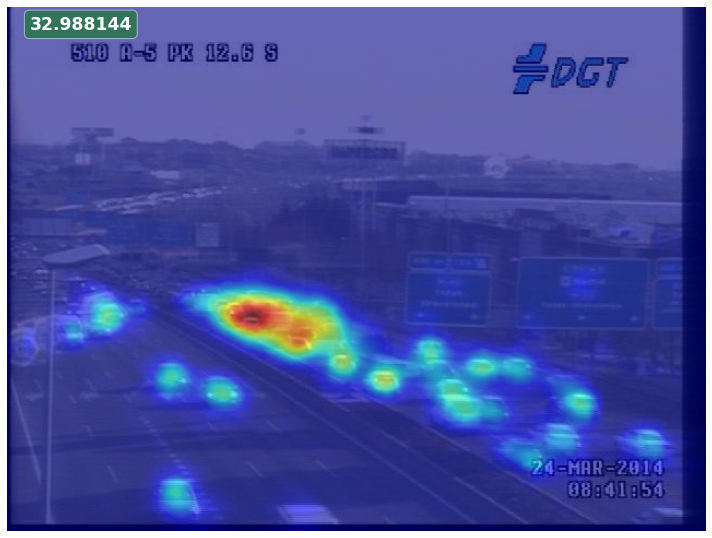

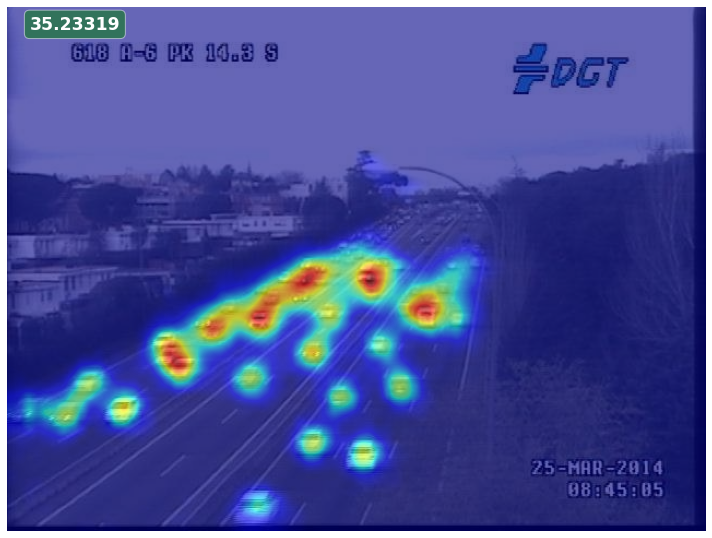

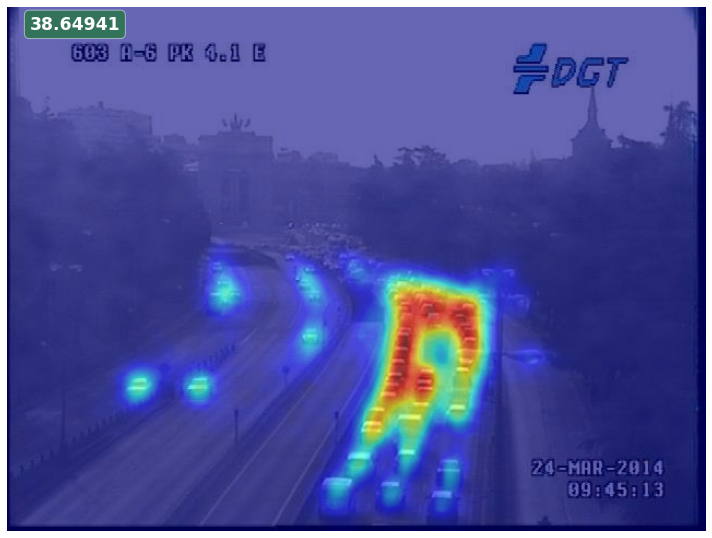

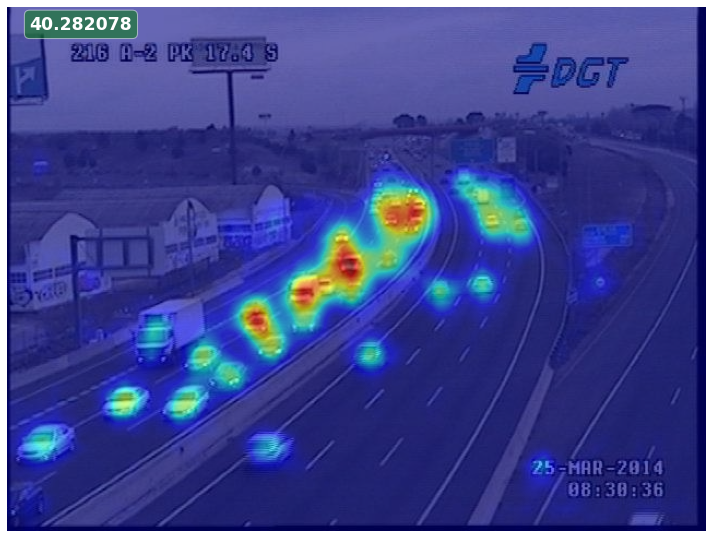

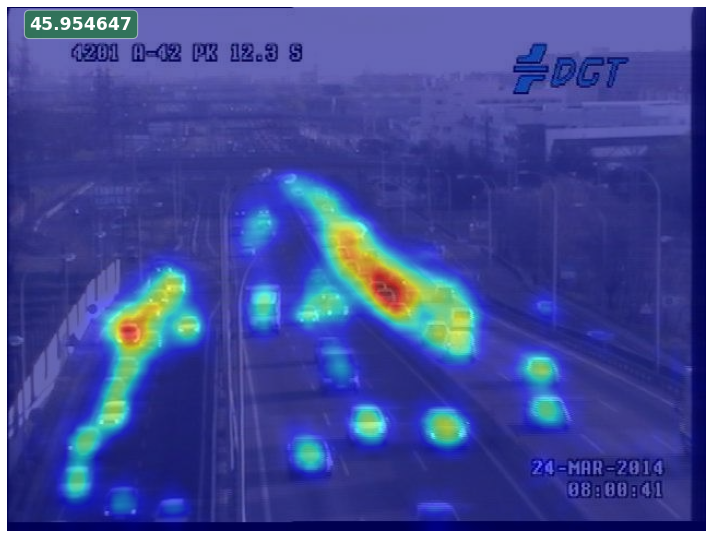

...

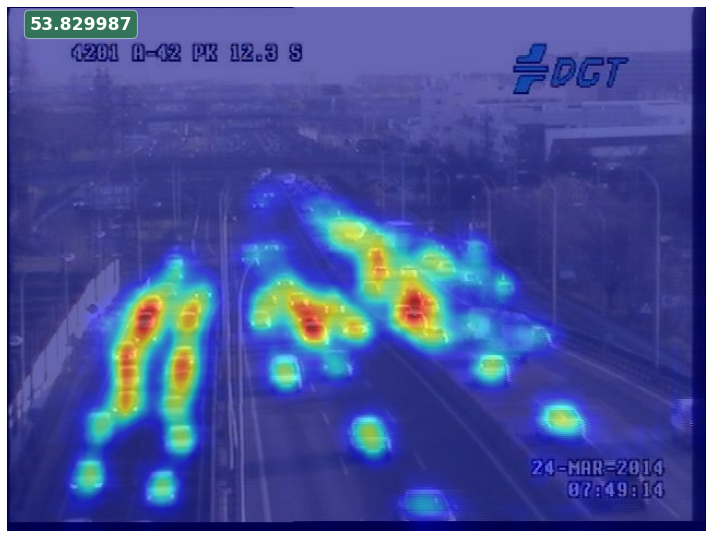

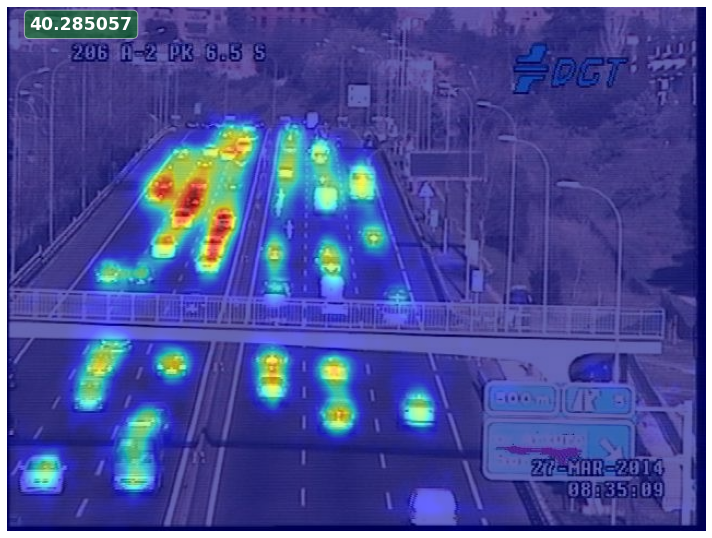

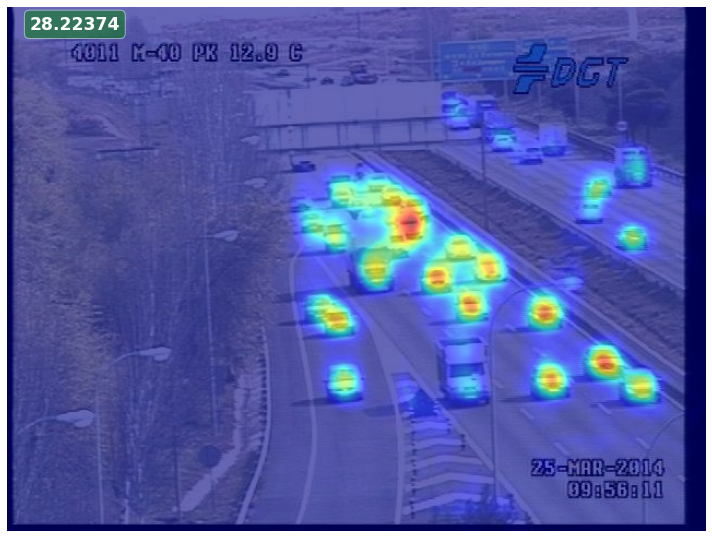

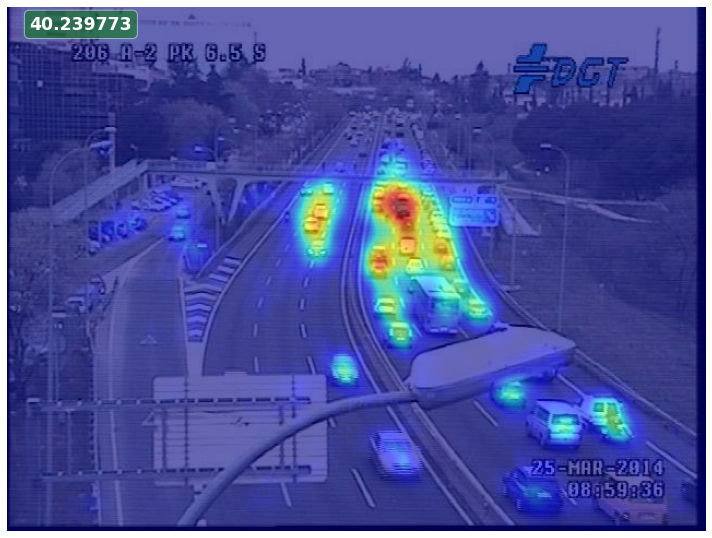

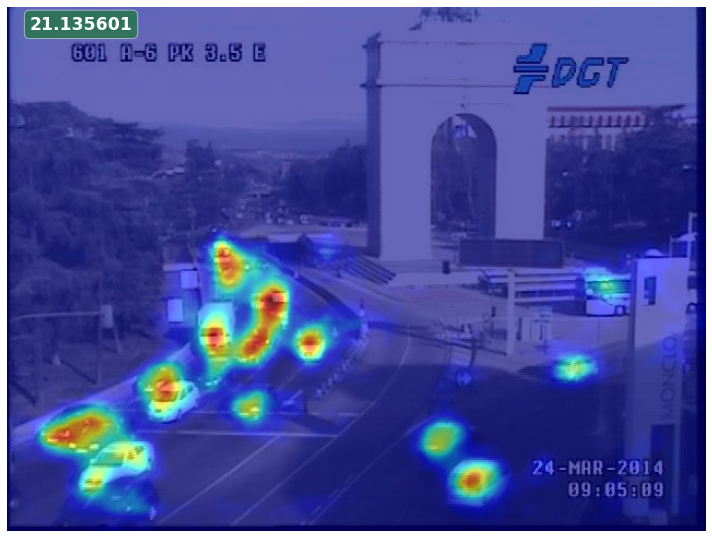

In [6]:
for image, density_map in test_dataset.take(20):
    img_plot = image.numpy()
    img_plot = (img_plot * 255).astype(np.uint8)

    pred_density_map = model_pretrained.predict(image)

    estimation = np.sum(pred_density_map)
    hm = HeatMap(img_plot[0] , pred_density_map[0], gaussian_std=0)
    hm.plot(transparency=0.6, color_map='jet', text=str(estimation))